In [1]:
using LogDensityProblems: LogDensityProblems;
using Distributions
using DelimitedFiles
using Random: Random
using DynamicPPL
using Turing
using LinearAlgebra
using AbstractMCMC

using AdvancedMH
import AdvancedMH; AMH = AdvancedMH
data = readdlm("data.txt")
t, y, yerr = data[:, 1], data[:, 2], data[:, 3]

using LinearAlgebra
using Turing
using Turing.Inference: _params_to_array
using DynamicPPL: Metadata, VarInfo, TypedVarInfo,
    islinked, invlink!, link!,
    setindex!!, push!!,
    setlogp!!, getlogp,
    VarName, getsym, vectorize,
    _getvns, getdist

fun(x,α,β,γ) = @. α * x^2 + β * x + γ
x = 0.0:0.5:15.0

@model function InferenceModel(y, t)
	α ~ Normal(2, 1)
	β ~ Normal(0, 1)
	γ ~ Normal(-2, 1)
	return y ~ MvNormal(fun(t, α, β, γ), I)
end

mymod = InferenceModel(y, t)


Model{typeof(InferenceModel), (:y, :t), (), (), Tuple{Vector{Float64}, Vector{Float64}}, Tuple{}, DefaultContext}(InferenceModel, (y = [-7.847359573362729, -1.3315947853190484, -0.5803510819209906, 1.1102764392598465, 9.988712842023517, 19.064552472027945, 22.360242601879634, 33.29037569667121, 44.30268624603188, 61.37029298584822  …  329.46633376403497, 367.3951090879816, 401.4586394961345, 429.0802630665355, 468.61496107560146, 507.32002150234865, 545.8993822489858, 589.8509862829196, 640.5342047989809, 675.5419963803967], t = [0.0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5  …  10.5, 11.0, 11.5, 12.0, 12.5, 13.0, 13.5, 14.0, 14.5, 15.0]), NamedTuple(), DefaultContext())

In [2]:
function get_complementary(i, N)
	indices = collect(1:N)
	deleteat!(indices, i)
	return indices
end

get_complementary (generic function with 1 method)

In [26]:
struct EnsembleSliceSampler{T<:Float64,A<:Int64} <: AdvancedMH.MHSampler
    "initial length scale"
    μ_init::T
    "number of adapation steps"
    M_adapt::A
    "number of walkers"
    n_walkers::A
    "max number of attempts"
    max_steps::A
end

struct EnSS{space, E <: EnsembleSliceSampler} <: Turing.Inference.InferenceAlgorithm
	ensemble::E
end

function EnSS(n_walkers::Int, μ_init = 1.0, M_adapt = 50, max_steps = 10000)
	ensemble = EnsembleSliceSampler(μ_init, M_adapt, n_walkers, max_steps)
	return EnSS{(), typeof(ensemble)}(ensemble)
end

struct EnSSState{V <: AbstractVarInfo, S}
	vi::V
	states::S
end

function AbstractMCMC.step(
	rng::Random.AbstractRNG,
	model::Model,
	spl::Sampler{<:EnSS};
	kwargs...)

	# Sample from the prior
	n = spl.alg.ensemble.n_walkers
	vis = [VarInfo(rng, model, SampleFromPrior()) for _ in 1:n]

	# Compute initial transition and states.
	# transition = map(Base.Fix1(Turing.Inference.Transition, model), vis)
	transition = [Turing.Inference.Transition(Turing.Inference.getparams(model, vi),getlogp(vi), (accepted=true, length_scale=spl.alg.ensemble.μ_init,t = 1)) for vi in vis]
	# println(transition[1])
	# TODO: Make compatible with immutable `AbstractVarInfo`.
	state = EnSSState(
		vis[1],
		map(vis) do vi
			vi = DynamicPPL.link!!(vi, spl, model)
			Transition(vi[spl], getlogp(vi), false, spl.alg.ensemble.μ_init, 1)
		end,
	)

	return transition, state
end

function AbstractMCMC.step(
	rng::Random.AbstractRNG, model::Model, spl::Sampler{<:EnSS}, state::EnSSState; kwargs...)
	# Generate a log joint function.
	vi = state.vi
	densitymodel = AMH.DensityModel(
		Base.Fix1(LogDensityProblems.logdensity, Turing.LogDensityFunction(model, vi)),
	)

	# Compute the next states.
	states = last(AbstractMCMC.step(rng, densitymodel, spl.alg.ensemble, state.states))

	# Compute the next transition and state.
	transition = map(states) do _state
		vi = setindex!!(vi, _state.params, spl)
		t = Turing.Inference.Transition(Turing.Inference.getparams(model, vi), _state.lp,(accepted=_state.accepted, length_scale=_state.μ,t = _state.t))#, false, spl.alg.ensemble.μ_init, 1)
		return t
	end
	newstate = EnSSState(vi, states)

	return transition, newstate
end

function AbstractMCMC.bundle_samples(
	samples::Vector{<:Vector},
	model::AbstractMCMC.AbstractModel,
	spl::Sampler{<:EnSS},
	state::EnSSState,
	chain_type::Type{MCMCChains.Chains};
	save_state = false,
	sort_chain = false,
	discard_initial = 0,
	thinning = 1,
	kwargs...)
	# Convert transitions to array format.
	# Also retrieve the variable names.
	params_vec = map(Base.Fix1(_params_to_array, model), samples)

	# Extract names and values separately.
	varnames = params_vec[1][1]
	varnames_symbol = map(Symbol, varnames)
	vals_vec = [p[2] for p in params_vec]

	# Get the values of the extra parameters in each transition.
	extra_vec = map(Turing.Inference.get_transition_extras, samples)

	# Get the extra parameter names & values.
	extra_params = extra_vec[1][1]
	extra_values_vec = [e[2] for e in extra_vec]

	# Extract names & construct param array.
	nms = [varnames_symbol; extra_params]
	# `hcat` first to ensure we get the right `eltype`.
	x = hcat(first(vals_vec), first(extra_values_vec))
	
	# Pre-allocate to minimize memory usage.
	parray = Array{eltype(x), 3}(undef, length(vals_vec), size(x, 2), size(x, 1))
	for (i, (vals, extras)) in enumerate(zip(vals_vec, extra_values_vec))
		parray[i, :, :] = transpose(hcat(vals, extras))
	end

	# Get the average or final log evidence, if it exists.
	le = Turing.Inference.getlogevidence(samples, state, spl)

	# Set up the info tuple.
	info = (varname_to_symbol = OrderedDict(zip(varnames, varnames_symbol)),)
	if save_state
		info = merge(info, (model = model, sampler = spl, samplerstate = state))
	end

	# Concretize the array before giving it to MCMCChains.
	parray = MCMCChains.concretize(parray)

	# Chain construction.
	chain = MCMCChains.Chains(
		parray,
		nms,
		(internals = extra_params,);
		evidence = le,
		info = info,
		start = discard_initial + 1,
		thin = thinning,
	)

	return sort_chain ? sort(chain) : chain
end


struct Transition{T, L <: Real} <: AdvancedMH.AbstractTransition
	params::T
	lp::L
	accepted::Bool
	μ::L
	t::Int
end


# Calculate the density of the model given some parameterization.
logdensity(model::DensityModel, params) = model.logdensity(params)
logdensity(::DensityModel, t::Transition) = t.lp
logdensity(model::AbstractMCMC.LogDensityModel, params) = LogDensityProblems.logdensity(model.logdensity, params)
logdensity(::AbstractMCMC.LogDensityModel, t::Transition) = t.lp

# Store the new draw, its log density, and draw information
Transition(model::AdvancedMH.DensityModelOrLogDensityModel, params, accepted, μ, t) = Transition(params, logdensity(model, params), accepted, μ, t)
function Transition(model::AbstractMCMC.LogDensityModel, params, accepted, μ, t)
	return Transition(params, LogDensityProblems.logdensity(model.logdensity, params), accepted, μ, t)
end
function Transition(model::DynamicPPL.Model, vie::AbstractVarInfo, accepted::Bool, μ, t)
	θ = getparams(model, vie)
	lp = getlogp(vie)
	return Transition(θ, lp, accepted, μ, t)
end

# Transition(mymod,vie, false, 1.0, 1)


Transition

In [50]:
using Turing.Inference: VarInfo, getparams, InferenceAlgorithm,get_transition_extras


In [27]:
struct ZeusProposal{P, F<:AbstractFloat} <: AdvancedMH.Proposal{P}
    proposal :: P
    μ::F
end

In [28]:
function AbstractMCMC.step(
	rng::Random.AbstractRNG,
	model::AdvancedMH.DensityModelOrLogDensityModel,
	spl::EnsembleSliceSampler,
	params_prev::Vector{<:Transition};
	kwargs...)
	transitions = propose(rng, spl, model, params_prev)
	return transitions, transitions
end

function propose(
	rng::Random.AbstractRNG,
	spl::EnsembleSliceSampler,
	model::AdvancedMH.DensityModelOrLogDensityModel,
	walkers::Vector{<:Transition})
	new_walkers = similar(walkers)
	n_walkers = spl.n_walkers
	M_adapt = spl.M_adapt
	μ = walkers[1].μ

	R, L, N_e, N_c = 0.0, 0.0, 0, 0
	for i in 1:n_walkers
		walker = walkers[i]

		indices = get_complementary(i, n_walkers)
		l, m = sample(rng, indices, 2, replace = false)

		new_walkers[i], R, L, N_e, N_c = move(rng, spl, model, walker, walkers[l], walkers[m], R, L, N_e, N_c)
	end

	t = new_walkers[1].t
	N_e = max(1, N_e)

	if t <= M_adapt
		new_μ = 2μ * N_e / (N_e + N_c)
		new_walkers_2 = similar(new_walkers)
		for i in 1:n_walkers
			new_walkers_2[i] = Transition(model, new_walkers[i].params, true, new_μ, t)
		end
		# println(new_μ)

		return new_walkers_2
	else
		# println("stop here")
		return new_walkers
	end
end

function DifferentialMove(μ, walker_l, walker_m)
	return μ * (walker_l - walker_m)
end

function move(
	rng::Random.AbstractRNG,
	spl::EnsembleSliceSampler,
	model::AdvancedMH.DensityModelOrLogDensityModel,
	walker::Transition,
	walker_l::Transition,
	walker_m::Transition, R::Float64, L::Float64, N_e::Int, N_c::Int)
	max_steps = spl.max_steps
	μ = walker.μ

	X′ = 0.0
	# get the move to the new position
	ηₖ = DifferentialMove(μ, walker_l.params, walker_m.params)
	# draw y position 
	δ = rand(rng, Exponential(1))
	Y = walker.lp - δ


	L = -rand(rng)
	R = L + 1
	l = 0
	# println("attention!")
	Y′ = Transition(model, walker.params + L .* ηₖ, false, μ, walker.t).lp

	while Y < Y′
		L = L - 1
		N_e = N_e + 1
		l += 1
		if l == max_steps
			error("Max steps reached", " iteration: ", t, " walker: ", k)
		end
		Y′ = Transition(model, walker.params + L .* ηₖ, false, μ, walker.t).lp
	end
	l = 0
	Y′ = Transition(model, walker.params + R .* ηₖ, false, μ, walker.t).lp
	while Y < Y′
		R = R + 1
		N_e = N_e + 1
		l += 1
		if l == max_steps
			error("Max steps reached")
		end
		Y′ = Transition(model, walker.params + R .* ηₖ, false, μ, walker.t).lp
	end

	l = 0
	while true
		l += 1
		X′ = rand(rng, Uniform(L, R))
		Y′ = Transition(model, walker.params + X′ .* ηₖ, false, μ, walker.t).lp
		if Y < Y′
			break
		end
		if X′ < 0
			L = X′
			N_c = N_c + 1
		else
			R = X′
			N_c = N_c + 1
		end
		if l == max_steps
			error("Max steps reached")
		end
	end

	Xₖ = X′ .* ηₖ + walker.params

	return Transition(model, Xₖ, true, μ, walker.t + 1), R, L, N_e, N_c

end

DynamicPPL.getspace(::EnSS) = ()

In [29]:

# n_schools = 8
# y = [28.0, 8.0, -3.0, 7.0, -1.0, 1.0, 18.0, 12.0] # estimated treatment effects
# σ = [15.0, 10.0, 16.0, 11.0, 9.0, 11.0, 10.0, 18.0] # standard error of the effect estimate
# @model function schools(y, σ)
#     μ ~ Normal(0, 5)
#     τ ~ truncated(Cauchy(0, 5), lower = 0)
#     θ ~ filldist(Normal(μ, τ), n_schools)
#     for i in 1:n_schools
#         y[i] ~ Normal(θ[i], σ[i])
#     end
# end

# @model function school_reparam(y, σ)
#     μ ~ Normal(0, 5)
#     τ ~ truncated(Cauchy(0, 5), lower = 0)
#     θ ~ filldist(Normal(0, 1), n_schools)
#     # y .~ ForEach(μ .+ τ .* θ, σ)
#     for i in 1:n_schools
#         y[i] ~ Normal(μ + τ * θ[i], σ[i])
#     end
# end

# mymod = school_reparam(y, σ)

In [30]:
fun(x,α,β,γ) = @. α * x^2 + β * x + γ
x = 0.0:0.5:15.0

@model function InferenceModel(y, t)
	α ~ Normal(2, 1)
	β ~ Normal(0, 1)
	γ ~ Normal(-2, 1)
	return y ~ MvNormal(fun(t, α, β, γ), I)
end

mymod = InferenceModel(y, t)
spl = EnSS(40)

EnSS{(), EnsembleSliceSampler{Float64, Int64}}(EnsembleSliceSampler{Float64, Int64}(1.0, 50, 40, 10000))

In [44]:
rng = Random.MersenneTwister(0)
chain = sample(rng,mymod, spl, 5_000,progress=true);

Sampling   0%|                                          |  ETA: N/A
Sampling   0%|▎                                         |  ETA: 0:01:01
Sampling   1%|▍                                         |  ETA: 0:00:39
Sampling   2%|▋                                         |  ETA: 0:00:30
Sampling   2%|▉                                         |  ETA: 0:00:25
Sampling   2%|█                                         |  ETA: 0:00:23
Sampling   3%|█▎                                        |  ETA: 0:00:22
Sampling   4%|█▌                                        |  ETA: 0:00:20
Sampling   4%|█▋                                        |  ETA: 0:00:19
Sampling   4%|█▉                                        |  ETA: 0:00:18
Sampling   5%|██▏                                       |  ETA: 0:00:17
Sampling   6%|██▎                                       |  ETA: 0:00:17
Sampling   6%|██▌                                       |  ETA: 0:00:16
Sampling   6%|██▊                                       |  ETA: 0:00

In [47]:
chain[100:end,:,:]

Chains MCMC chain (4901×7×40 Array{Float64, 3}):

Iterations        = 100:1:5000
Number of chains  = 40
Samples per chain = 4901
parameters        = α, β, γ
internals         = lp, accepted, length_scale, t

Summary Statistics
  parameters      mean       std      mcse     ess_bulk     ess_tail      rhat ⋯
      Symbol   Float64   Float64   Float64      Float64      Float64   Float64 ⋯

           α    3.0479    0.0094    0.0000   39441.3336   55727.4768    1.0006 ⋯
           β   -0.2431    0.1423    0.0007   39307.8662   54727.4099    1.0006 ⋯
           γ   -3.4549    0.4473    0.0023   39039.1892   54129.9274    1.0007 ⋯
                                                                1 column omitted

Quantiles
  parameters      2.5%     25.0%     50.0%     75.0%     97.5% 
      Symbol   Float64   Float64   Float64   Float64   Float64 

           α    3.0294    3.0415    3.0479    3.0542    3.0662
           β   -0.5210   -0.3393   -0.2437   -0.1471    0.0363
           γ   -4.33

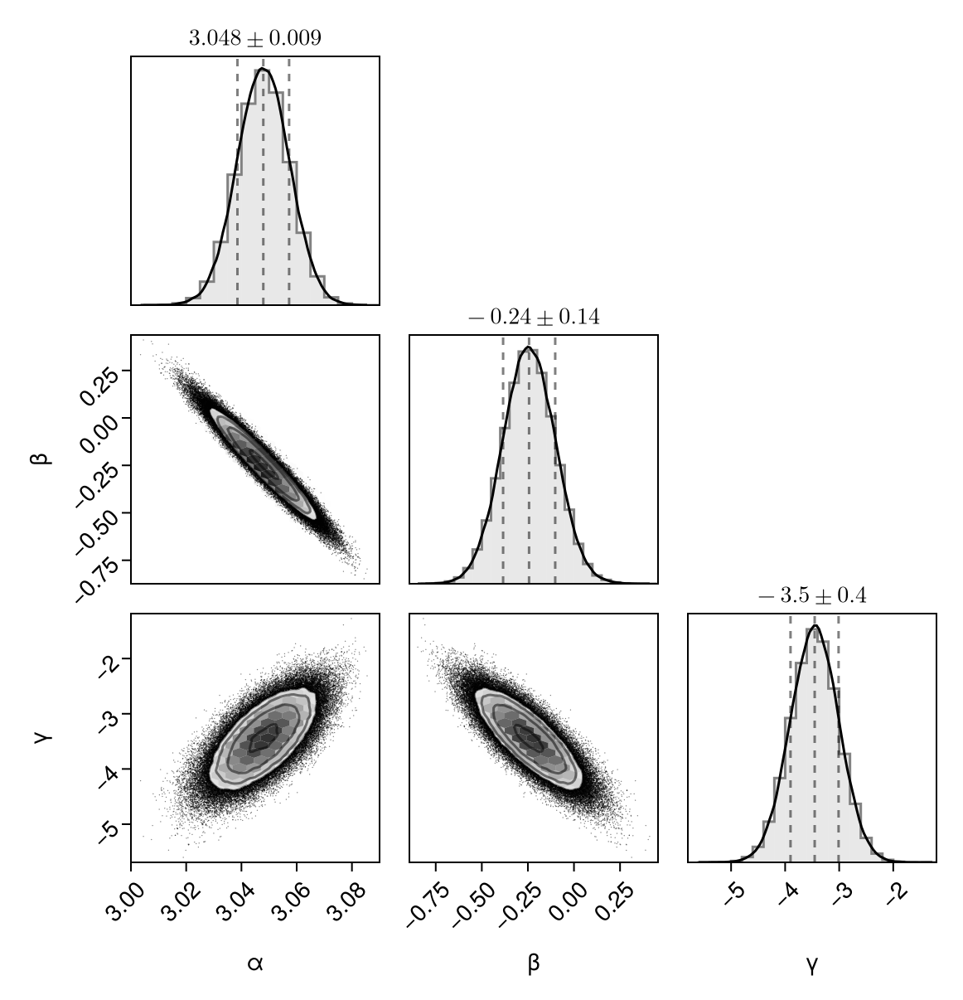

In [49]:
using PairPlots
import CairoMakie
pairplot(chain[100:end,:,:])

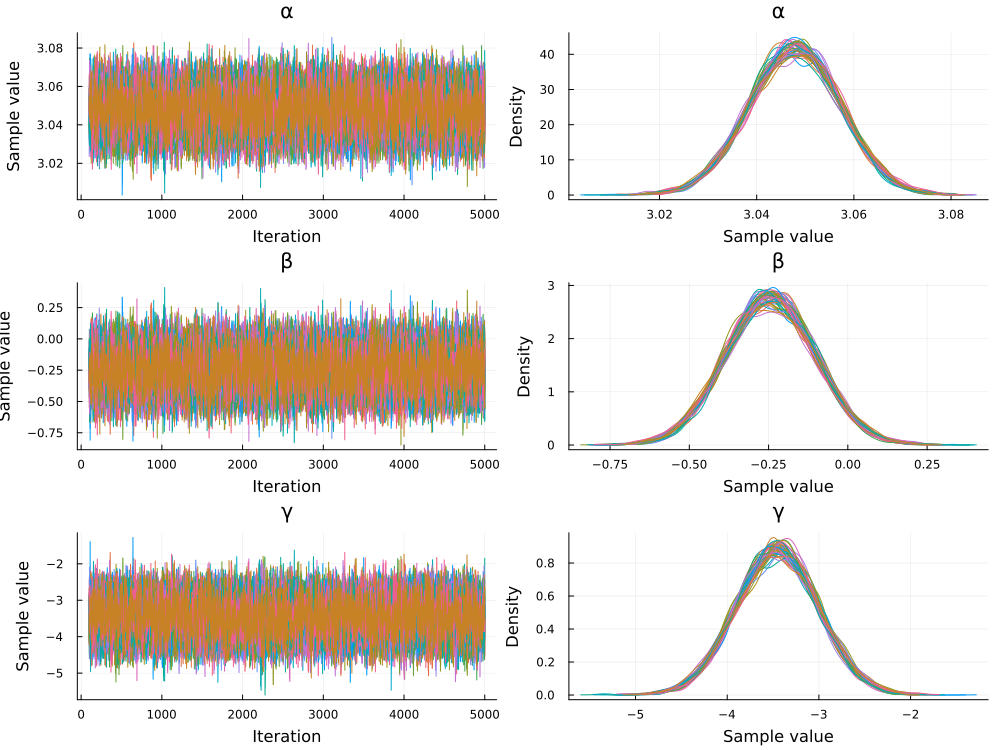

In [48]:
using StatsPlots
StatsPlots.plot(chain[100:end,:,:])

In [189]:
Array(chain,append_chains=false)

5-element Vector{Matrix{Float64}}:
 [2.6791074260357775 0.8284134829000359 -2.353007400300596; 2.432332719782235 0.7671938236919813 -2.358687026928761]
 [1.8651461280694783 0.5866170746331097 -1.7026641491505838; 2.8527434367487814 1.0934450523693562 -2.3074318991694898]
 [2.0649475485483424 -0.10901738508171745 -2.514210390833322; 2.1671687491309273 0.676336309651388 -1.9439758353360408]
 [3.574330202136989 -0.6889071278256981 -2.7628038164104582; 0.7524125620873241 4.460742749632663 2.8169971290462628]
 [2.3974824092181635 0.8116296225068749 -2.3463546042787984; 2.9698432379828787 -0.4566692726323862 -2.6632455733244425]